# Opening original data

In [2]:
import pyreadstat
import pygwalker as pyg

data, meta = pyreadstat.read_xport('06191-0001-Data.xpt')

In [3]:
data

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61
0,67.0,1.0,9.0,9.0,9999999999,VVWIIK779274,AK,001,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
1,25.0,9.0,9.0,9.0,9999999999,UCQRBF359793,AK,001,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
2,40.0,9.0,9.0,9.0,9999999999,HTHMWC509187,AK,001,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
3,27.0,9.0,9.0,9.0,9999999999,XJLXLX379698,AK,AST,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
4,25.0,9.0,9.0,9.0,9999999999,SQXRBF358795,AK,999,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,59.0,2.0,9.0,9.0,9999999999,100000040643,VT,VSP,,1989.0,...,116.0,9.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
736842,28.0,1.0,9.0,9.0,9999999999,100000011009,VT,999,,1990.0,...,99999.0,4.0,0.0,0.0,15.0,0.0,0.0,30.0,3.0,1990.0
736843,20.0,1.0,9.0,9.0,9999999999,100000041557,VT,014,,1989.0,...,195.0,14.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
736844,43.0,1.0,9.0,9.0,9999999999,100000040435,VT,014,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0


# Opening data after counties renaming (RTabulizer)

## Missing values (substituting)

In [32]:
import pandas as pd
import numpy as np

In [33]:
df = pd.read_csv('renamed_data.csv')
df

/var/folders/p9/d79c5zx13b377v_v34ldc8zh0000gn/T/ipykernel_30504/2238894496.py:1: DtypeWarning: Columns (5,21,31,46) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('renamed_data.csv')


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V53,V54,V55,V56,V57,V58,V59,V60,V61,state_code
0,67,1,9,9,9999999999,VVWIIK779274,AK,Anchorage,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-001
1,25,9,9,9,9999999999,UCQRBF359793,AK,Anchorage,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-001
2,40,9,9,9,9999999999,HTHMWC509187,AK,Anchorage,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-001
3,27,9,9,9,9999999999,XJLXLX379698,AK,Alaska State Troopers,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-AST
4,25,9,9,9,9999999999,SQXRBF358795,AK,Unknown,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,59,2,9,9,9999999999,100000040643,VT,Dept of Pub Sfty Waterbury VT,NaN,1989,...,9,888,88,888,888,88,888,8,1990,VT-VSP
736842,28,1,9,9,9999999999,100000011009,VT,Unknown,NaN,1990,...,4,0,0,15,0,0,30,3,1990,VT-999
736843,20,1,9,9,9999999999,100000041557,VT,Windsor,NaN,1989,...,14,888,88,888,888,88,888,8,1990,VT-014
736844,43,1,9,9,9999999999,100000040435,VT,Windsor,NaN,1990,...,88,888,88,888,888,88,888,8,1990,VT-014


### Fictional NA

In [34]:
# set values in columns 24 through 61 to 'case closed/on hold' where V17 does not equal '8'
df.loc[df['V17'].isin([1, 2, 3, 4, 5, 9]), df.columns[23:]] = 'case closed/on hold'


# set values in columns 34 through 61 to 'case closed/on hold' where V27 equals 4, 5, 7, 8, or 9
df.loc[df['V27'].isin([4, 5, 7, 8, 9]), df.columns[33:]] = 'case closed/on hold'


# set values in columns 54 through 61 to 'not convicted, no sentence' where V53 equals 77
df.loc[df['V53'].isin([77]), df.columns[53:]] = 'not convicted, no sentence'

### Natural NA

In [35]:
replace_dict = {
    'V1': 99,
    'V2': 9,
    'V3': 9,
    'V4': 9,
    'V5': 9999999999,
    'V8': 999,
    'V9': 99,
    'V10': 9999,
    'V11': 99,
    'V12': 99,
    'V13': 99,
    'V15': 9999,
    'V16': [4, 9],
    'V17': 9,
    'V18': 9999,
    'V19': 99,
    'V20': 99,
    'V21': 99999,
    'V22': 9,
    'V23': 9,
    'V24': 9999,
    'V25': 9,
    'V26': 99,
    'V27': 9,
    'V28': 9999,
    'V29': 99,
    'V30': 99,
    'V31': 99999,
    'V32': 9,
    'V33': 9,
    'V34': 9999,
    'V35': 9,
    'V36': 99,
    'V37': 99,
    'V38': 99,
    'V39': 9999,
    'V40': 99,
    'V41': 99,
    'V42': 99999,
    'V43': 9,
    'V44': 9,
    'V45': 9,
    'V46': 9,
    'V47': 9,
    'V48': 9,
    'V49': 9999,
    'V50': 99,
    'V51': 99,
    'V52': 99999,
    'V53': 99,
    'V54': 999,
    'V55': 99,
    'V56': 999,
    'V57': 999,
    'V58': 99,
    'V59': 999,
    'V60': 9    
}


columns_to_replace = list(replace_dict.keys())

df[columns_to_replace] = df[columns_to_replace].replace(replace_dict, value=np.nan)

# Data relabelling 

In [36]:
value_dict = {1: 'male', 2: 'female'}
df['V2'] = df['V2'].replace(value_dict)

value_dict = {1: 'white', 2: 'black', 3: 'american indian or alaskan native', 4: 'asian or pacific islander'}
df['V3'] = df['V3'].replace(value_dict)

value_dict = {1: 'hispanic', 2: 'non-hispanic'}
df['V4'] = df['V4'].replace(value_dict)

value_dict = {1: 'only one arrest charge', 88: 'not disposed by police', 99: 'condensed record for multiple charges'}
df['V14'] = df['V14'].replace(value_dict)

value_dict = {1: 'felony level', 2: 'misdemeanor level', 3: 'other level'}
df['V16'] = df['V16'].replace(value_dict)

value_dict = {1: 'transfer to other law enforcement agency', 2: 'transfer to other agency', 
              3: 'released', 4: 'other final disposition', 5: 'constructed code (police disposition determined)',
             8: 'not disposed by police'}
df['V17'] = df['V17'].replace(value_dict)

value_dict = {8888: 'not disposed by police'}
df['V18'] = df['V18'].replace(value_dict)

value_dict = {88: 'not disposed by police'}
df['V19'] = df['V19'].replace(value_dict)

value_dict = {88: 'not disposed by police'}
df['V20'] = df['V20'].replace(value_dict)

value_dict = {'A': 'attempt to commit', 'B': 'assault to commit', 'C': 'conspiracy to commit', 
              'F': 'facilitation of commit', 'S': 'solicitation of commit', 'T': 'threaten to commit',
             'U': 'unsupplemented actual offense', 'X': 'aid/abet', 'Y': 'accessory before the fact',
             'Z': 'accessory after the fact'}
df['V22'] = df['V22'].replace(value_dict)

value_dict = {1: 'not released from custody', 2: 'released, own recognizance', 3: 'released, private bail',
             4: 'released, professional bail', 5: 'released to a third party', 6: 'court ordered release', 
             7: 'other release', 8: 'not applicable, not awaiting trial'}
df['V23'] = df['V23'].replace(value_dict)

value_dict = {8888: 'inapplicable, not charged'}
df['V24'] = df['V24'].replace(value_dict)

value_dict = {1: 'felony level', 2: 'misdemeanor level', 3: 'other level', 4: 'level not specified',
             8: 'inapplicable, not charged'}
df['V25'] = df['V25'].replace(value_dict)

value_dict = {88: 'inapplicable, no offense charged or filed'}
df['V26'] = df['V26'].replace(value_dict)

value_dict = {1: 'prosecution, felony charge', 2: 'prosecution, misdemeanor charge', 3: 'prosecution, other charge',
             4: 'prosecution declined, nolle prosequi', 5: 'no true bill', 
              6: 'constructed code, prosecuted, level not specified', 
             7: 'constructed code, not prosecuted, reason not determined', 8: 'not disposed by prosecutor/grand jury'}
df['V27'] = df['V27'].replace(value_dict)


value_dict = {8888: 'not disposed by prosecutor/grand jury'}
df['V28'] = df['V28'].replace(value_dict)

value_dict = {88: 'not disposed by prosecutor/grand jury'}
df['V29'] = df['V29'].replace(value_dict)

value_dict = {88: 'not disposed by prosecutor/grand jury'}
df['V30'] = df['V30'].replace(value_dict)

value_dict = {8: 'not disposed by the prosecutor/grand jury', 'A': 'attempt to commit', 'B': 'assault to commit', 
              'C': 'conspiracy to commit', 'F': 'facilitation of commit', 'S': 'solicitation of commit', 
              'T': 'threaten to commit', 'U': 'unsupplemented actual offense', 'X': 'aid/abet', 
              'Y': 'accessory before the fact', 'Z': 'accessory after the fact'}
df['V32'] = df['V32'].replace(value_dict)

value_dict = {1: 'not released from custody', 2: 'released, own recognizance', 3: 'released, private bail',
             4: 'released, professional bail', 5: 'released to a third party', 6: 'court ordered release', 
             7: 'other release', 8: 'not applicable, not awaiting trial'}
df['V33'] = df['V33'].replace(value_dict)

value_dict = {8888: 'inapplicable, not charged'}
df['V34'] = df['V34'].replace(value_dict)

value_dict = {1: 'felony level', 2: 'misdemeanor level', 3: 'other level', 4: 'level not specified'}
df['V35'] = df['V35'].replace(value_dict)


value_dict = {1: 'convicted', 2: 'probation without verdict', 3: 'not guilty by reason of insanity', 
              4: 'acquitted', 5: 'dismissed', 6: 'civil procedure', 7: 'off calendar', 
             8: 'guilty but mentally ill', 11: 'nolle prosequi', 12: 'other', 
             13: 'constructed code, disposition by court, disposition unknown', 
              14: 'constructed code, disposition by court, sentence imposed'}
df['V37'] = df['V37'].replace(value_dict)

value_dict = {1: 'lower', 2: 'upper', 3: 'other court'}
df['V43'] = df['V43'].replace(value_dict)

value_dict = {1: 'non-jury', 2: 'jury', 3: 'transcript', 4: 'other', 5: 'dismissal'}
df['V44'] = df['V44'].replace(value_dict)

value_dict = {1: 'private', 2: 'assigned councel', 3: 'self', 4: 'public defender', 5: 'other'}
df['V45'] = df['V45'].replace(value_dict)

value_dict = {1: 'not guilty', 2: 'not guilty by reason of insanity', 3: 'guilty', 4: 'nolo contendere', 5: 'other'}
df['V46'] = df['V46'].replace(value_dict)


value_dict = {8: 'not disposed by the court', 'A': 'attempt to commit', 'B': 'assault to commit', 
              'C': 'conspiracy to commit', 'F': 'facilitation of commit', 'S': 'solicitation of commit', 
              'T': 'threaten to commit', 'U': 'unsupplemented actual offense', 'X': 'aid/abet', 
              'Y': 'accessory before the fact', 'Z': 'accessory after the fact'}
df['V47'] = df['V47'].replace(value_dict)

value_dict = {1: 'not released from custody', 2: 'released, own recognizance', 3: 'released, private bail',
             4: 'released, professional bail', 5: 'released to a third party', 6: 'court ordered release', 
             7: 'other release', 8: 'not applicable, not awaiting trial'}
df['V48'] = df['V48'].replace(value_dict)


value_dict = {8888: 'not convicted, no sentence'}
df['V49'] = df['V49'].replace(value_dict)

value_dict = {88: 'not convicted, no sentence'}
df['V50'] = df['V50'].replace(value_dict)


value_dict = {1: 'death', 2: 'prison, with or without fine', 3: 'prison and restitution, with or without fine',
             4: 'jail, with or without fine', 5: 'jail and restitution, with or without fine', 
             6: 'probation with prison or jail sentence suspended', 7: 'probation, with or without fine', 
             8: 'probation and restitution, with or without fine', 9: 'fine with prison or jail sentence suspended', 
             10: 'fine only', 11: 'fine and restitution', 12: 'restitution only', 13: 'other', 
             14: 'sentencing deferred', 15: 'entire sentence suspended', 16: 'prison and probation', 
             17: 'jail and probation', 18: 'residential community corrections', 
             19: 'constructed code, incarceration determined', 20: 'constructed code, non-incarceration determined', 
            21: 'constructed code, unknown sentence imposed', 77: 'not convicted, no sentence'}
df['V53'] = df['V53'].replace(value_dict)


value_dict = {555: 'death', 666: 'life', 777: 'indeterminate', 888: 'not sentenced to incarceration'}
df['V54'] = df['V54'].replace(value_dict)

value_dict = {55: 'death', 66: 'life', 77: 'indeterminate', 88: 'not sentenced to incarceration'}
df['V55'] = df['V55'].replace(value_dict)

value_dict = {555: 'death', 666: 'life', 777: 'indeterminate', 888: 'not sentenced to incarceration'}
df['V56'] = df['V56'].replace(value_dict)

value_dict = {555: 'death', 666: 'life', 777: 'indeterminate', 888: 'not sentenced to incarceration'}
df['V57'] = df['V57'].replace(value_dict)

value_dict = {55: 'death', 66: 'life', 77: 'indeterminate', 88: 'not sentenced to incarceration'}
df['V58'] = df['V58'].replace(value_dict)

value_dict = {555: 'death', 666: 'life', 777: 'indeterminate', 888: 'not sentenced to incarceration'}
df['V59'] = df['V59'].replace(value_dict)


value_dict = {1: 'one prison or jail sentence', 2: 'two or more concurrent sentences', 
              3: 'two or more consecutive sentences', 4: 'mixture of concurrent and consecutive sentences',
             8: 'no prison or jail sentence'}
df['V60'] = df['V60'].replace(value_dict)

## New column names

In [37]:
new_column_names = ['age_at_arrest', 'sex', 'race', 'ethnic_origin', 'incident_number', 'encrypted_id_number', 
                    'state', 'arresting_agency_county', 'sub_county_code', 'year_of_arrest', 'month_of_arrest', 
                    'day_of_arrest', 'number_of_arrest_charges', 'sequence_number_of_charges', 
                    'arrest_chg_offense_code', 'level_of_arrest_charge', 'police_disposition', 
                    'year_of_police_disposition', 'month_of_police_disposition', 'day_of_police_disposition',
                    'elapsed_time_police_disp', 'general_offense_code_police', 'pre_trial_status_police', 
                    'charged_offense_code', 'level_of_charged_offense', 'number_of_charged_filed_offenses', 
                    'prosec_grand_jury_disposition', 'year_of_prosec_disp', 'month_of_prosec_disp', 
                    'day_of_prosec_disp', 'elapsed_time_prosec_disp', 'general_offense_code_prosec',
                    'pre_trial_status_prosec', 'court_disp_offense_code', 'level_of_court_disp_offenses', 
                    'number_of_court_disp_offenses', 'court_disposition', 'number_of_conviction_offenses', 
                    'year_of_final_court_disp', 'month_of_final_court_disp', 'day_of_final_court_disp',
                    'elapsed_time_final_court_disp', 'type_of_court_final_disp', 'type_of_trial', 
                    'type_of_counsel_at_disp', 'final_pleading', 'general_offense_code_court', 
                    'pre_trial_status_court', 'year_of_sentencing_date', 'month_of_sentencing_date', 
                    'day_of_sentencing_date', 'elapsed_time_of_sentencing_date', 'sentencing_type', 
                    'years_of_sentencing_min', 'months_of_sentencing_min', 'days_of_sentencing_min', 
                    'years_of_sentencing_max', 'months_of_sentencing_max', 'days_of_sentencing_max', 
                   'multiple_incar_sentence', 'year_disposition_determined', 'state_code']

df.columns = new_column_names

# Transforming sentencing min/max

In [38]:
string_values_to_skip = ['case closed/on hold', 'not sentenced to incarceration','not convicted, no sentence',
                        'death', 'life', 'indeterminate']  

def transform_days_min(row):
    days_min = row['days_of_sentencing_min']
    months_min = row['months_of_sentencing_min']
    years_min = row['years_of_sentencing_min']

    if any(val in string_values_to_skip for val in [days_min, months_min, years_min]):
        return days_min

    if isinstance(days_min, str):
        days_min = pd.to_numeric(days_min, errors='coerce')
    if isinstance(months_min, str):
        months_min = pd.to_numeric(months_min, errors='coerce')
    if isinstance(years_min, str):
        years_min = pd.to_numeric(years_min, errors='coerce')

    days = 0
    if pd.notnull(days_min):
        days += days_min
    if pd.notnull(months_min):
        days += months_min * 30
    if pd.notnull(years_min):
        days += years_min * 365

    return days

def transform_days_max(row):
    days_max = row['days_of_sentencing_max']
    months_max = row['months_of_sentencing_max']
    years_max = row['years_of_sentencing_max']

    if any(val in string_values_to_skip for val in [days_max, months_max, years_max]):
        return days_max

    if isinstance(days_max, str):
        days_max = pd.to_numeric(days_max, errors='coerce')
    if isinstance(months_max, str):
        months_max = pd.to_numeric(months_max, errors='coerce')
    if isinstance(years_max, str):
        years_max = pd.to_numeric(years_max, errors='coerce')

    days = 0
    if pd.notnull(days_max):
        days += days_max
    if pd.notnull(months_max):
        days += months_max * 30
    if pd.notnull(years_max):
        days += years_max * 365

    return days

df['days_of_sentencing_min'] = df.apply(transform_days_min, axis=1)
df['days_of_sentencing_max'] = df.apply(transform_days_max, axis=1)

# dropping columns
df.drop(columns=['years_of_sentencing_min', 'years_of_sentencing_max', 
                 'months_of_sentencing_min', 'months_of_sentencing_max'], inplace=True)

# Final view

In [39]:
df

,age_at_arrest,sex,race,ethnic_origin,incident_number,encrypted_id_number,state,arresting_agency_county,sub_county_code,year_of_arrest,...,year_of_sentencing_date,month_of_sentencing_date,day_of_sentencing_date,elapsed_time_of_sentencing_date,sentencing_type,days_of_sentencing_min,days_of_sentencing_max,multiple_incar_sentence,year_disposition_determined,state_code
0,67.0,male,NaN,NaN,NaN,VVWIIK779274,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
1,25.0,NaN,NaN,NaN,NaN,UCQRBF359793,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
2,40.0,NaN,NaN,NaN,NaN,HTHMWC509187,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
3,27.0,NaN,NaN,NaN,NaN,XJLXLX379698,AK,Alaska State Troopers,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
4,25.0,NaN,NaN,NaN,NaN,SQXRBF358795,AK,Unknown,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,59.0,female,NaN,NaN,NaN,100000040643,VT,Dept of Pub Sfty Waterbury VT,NaN,1989,...,1990,3,NaN,116,fine with prison or jail sentence suspended,not sentenced to incarceration,not sentenced to incarceration,no prison or jail sentence,1990,VT-VSP
736842,28.0,male,NaN,NaN,NaN,100000011009,VT,Unknown,NaN,1990,...,1990,1,NaN,NaN,"jail, with or without fine",15,30,two or more consecutive sentences,1990,VT-999
736843,20.0,male,NaN,NaN,NaN,100000041557,VT,Windsor,NaN,1989,...,1990,5,NaN,195,sentencing deferred,not sentenced to incarceration,not sentenced to incarceration,no prison or jail sentence,1990,VT-014
736844,43.0,male,NaN,NaN,NaN,100000040435,VT,Windsor,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold


In [40]:
# checking if the only values containing '9' are numeric ones (time, number of, etc.)
check = df.loc[:, df.eq(9).any()]
check

,month_of_arrest,number_of_arrest_charges,month_of_police_disposition,elapsed_time_police_disp,number_of_charged_filed_offenses,month_of_prosec_disp,elapsed_time_prosec_disp,number_of_court_disp_offenses,number_of_conviction_offenses,month_of_final_court_disp,elapsed_time_final_court_disp,month_of_sentencing_date,elapsed_time_of_sentencing_date,days_of_sentencing_min,days_of_sentencing_max
0,1.0,5.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
1,1.0,1.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
2,1.0,3.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
3,1.0,1.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
4,1.0,1.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,12.0,1.0,not disposed by police,NaN,NaN,not disposed by prosecutor/grand jury,NaN,NaN,NaN,3,116,3,116,not sentenced to incarceration,not sentenced to incarceration
736842,NaN,1.0,not disposed by police,NaN,NaN,not disposed by prosecutor/grand jury,NaN,NaN,NaN,1,NaN,1,NaN,15,30
736843,11.0,1.0,not disposed by police,NaN,NaN,not disposed by prosecutor/grand jury,NaN,NaN,NaN,5,195,5,195,not sentenced to incarceration,not sentenced to incarceration
736844,NaN,1.0,not disposed by police,NaN,0,5,NaN,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold


## Saving updated data

In [41]:
df.to_csv('obts_recoded.csv')

# NA & counties

In [42]:
# replacing empty strings with natural NA (as we created empty strings for concatenation only)

df['state_code'] = df['state_code'].replace('', np.nan)
df['state'] = df['state'].replace('', np.nan)

In [43]:
# getting unique values of county_true
unique_categories = df['state_code'].dropna().unique()

# creating a dictionary to store subsets of the data
dt_dict = {}

# looping through unique categories and creating a subset for each one
for category in unique_categories:
    subset_name = f'dt_{category}' 
    dt_dict[subset_name] = df[df['state_code'] == category]

# printing summary of the 'dt_AK_001' subset as an example
print(dt_dict['dt_AK-001'].describe())

       age_at_arrest  incident_number  sub_county_code  year_of_arrest  \
count    1026.000000              0.0              0.0     1027.000000   
mean       29.203704              NaN              NaN     1989.271665   
std         9.857147              NaN              NaN        0.925703   
min        11.000000              NaN              NaN     1984.000000   
25%        22.000000              NaN              NaN     1989.000000   
50%        27.000000              NaN              NaN     1989.000000   
75%        34.000000              NaN              NaN     1990.000000   
max        83.000000              NaN              NaN     1990.000000   

       month_of_arrest  day_of_arrest  number_of_arrest_charges  \
count      1027.000000            0.0               1027.000000   
mean          6.591042            NaN                  2.150925   
std           3.496620            NaN                  2.133371   
min           1.000000            NaN                  1.000000  

### Mean value of NA in each column

In [44]:
# getting unique values of state
unique_categories = df['state_code'].dropna().unique()

# looping through unique categories and creating a dictionary to store the mean percentage of missing values
mean_missing_dict = {}
for category in unique_categories:
    # creating a subset for the category
    subset_name = f'dt_{category}' 
    subset = df[df['state_code'] == category]

    # counting percentage of missing values for each column in the subset
    missing_percentages = subset.isna().mean() * 100

    # calculating the mean percentage of missing values across all columns for the subset
    mean_missing = missing_percentages.mean()

    # adding the mean percentage of missing values to the dictionary
    mean_missing_dict[subset_name] = mean_missing

# printing the mean percentage of missing values for each subset
for subset_name, mean_missing in mean_missing_dict.items():
    print(f'{subset_name}: {mean_missing}')

dt_case closed/on hold: 17.478806664083685
dt_AK-999: 28.98739452026252
dt_not convicted, no sentence: 37.22646589856797
dt_AK-001: 28.640499613873686
dt_AK-AST: 29.034147974556415
dt_AK-DI0: 29.006085192697768
dt_AK-BND: 28.103448275862068
dt_AL-SS3: 37.93103448275862
dt_AL-003: 40.53711462025997
dt_AL-001: 40.09950560110145
dt_AL-047: 40.1688951442646
dt_AL-052: 39.93135011441648
dt_AL-059: 40.24630541871921
dt_AL-014: 39.40886699507389
dt_AL-002: 40.05883011206497
dt_AL-012: 41.64750957854406
dt_AL-041: 40.311986863711
dt_AL-029: 40.38461538461539
dt_AL-005: 40.64848172928461
dt_AL-067: 39.9316851008458
dt_AL-064: 40.929057764111576
dt_AL-038: 40.40881621045148
dt_AL-039: 40.355603448275865
dt_AL-013: 41.05400130123617
dt_AL-057: 41.44346431435445
dt_AL-004: 40.19865067466267
dt_AL-011: 40.156851502989596
dt_AL-031: 40.21352313167259
dt_AL-023: 40.157256536566884
dt_AL-022: 38.25031928480204
dt_AL-063: 40.475555259120924
dt_AL-027: 40.56963231091636
dt_AL-061: 39.85334918747523
dt_A

# NA & states

In [45]:
# getting unique values of state
unique_categories = df['state'].dropna().unique()

# creating a dictionary to store subsets of the data
dt_dict = {}

# looping through unique categories and creating a subset for each one
for category in unique_categories:
    subset_name = f'dt_{category}' 
    dt_dict[subset_name] = df[df['state'] == category]

# printing summary of the 'dt_001' subset
print(dt_dict['dt_AK'].describe())

       age_at_arrest  incident_number  sub_county_code  year_of_arrest  \
count    3625.000000              0.0              0.0     3649.000000   
mean       29.912828              NaN              NaN     1989.389696   
std         9.979317              NaN              NaN        1.057276   
min        11.000000              NaN              NaN     1984.000000   
25%        22.000000              NaN              NaN     1989.000000   
50%        28.000000              NaN              NaN     1990.000000   
75%        35.000000              NaN              NaN     1990.000000   
max        83.000000              NaN              NaN     1990.000000   

       month_of_arrest  day_of_arrest  number_of_arrest_charges  \
count      3649.000000            0.0               3649.000000   
mean          6.366950            NaN                  1.877227   
std           3.388806            NaN                  1.771252   
min           1.000000            NaN                  1.000000  

### Mean value of NA in each column

In [46]:
# getting unique values of state
unique_categories = df['state'].dropna().unique()

# looping through unique categories and creating a dictionary to store the mean percentage of missing values
mean_missing_dict = {}
for category in unique_categories:
    # creating a subset for the category
    subset_name = f'dt_{category}' 
    subset = df[df['state'] == category]

    # counting percentage of missing values for each column in the subset
    missing_percentages = subset.isna().mean() * 100

    # calculating the mean percentage of missing values across all columns for the subset
    mean_missing = missing_percentages.mean()

    # adding the mean percentage of missing values to the dictionary
    mean_missing_dict[subset_name] = mean_missing

# printing the mean percentage of missing values for each subset
for subset_name, mean_missing in mean_missing_dict.items():
    print(f'{subset_name}: {mean_missing}')

dt_AK: 24.990313831848134
dt_AL: 40.4655322840252
dt_CA: 36.55661958852161
dt_ID: 35.62971096207492
dt_MN: 28.843257145088682
dt_MO: 22.76607543842106
dt_NB: 36.877202681224524
dt_NJ: 27.109307941449128
dt_NY: 37.848853282106475
dt_PA: 24.022026298238924
dt_VA: 37.89218485628823
dt_VT: 29.564019219898242


# Bar charts for police/prosecution/court dispositions variables

In [47]:
%matplotlib inline
import matplotlib.pyplot as plt

data = pd.read_csv('obts_recoded.csv')

data_copy = data.copy()
data_copy['police_disposition'] = data_copy['police_disposition'].fillna('NaN')
data_copy['prosec_grand_jury_disposition'] = data_copy['prosec_grand_jury_disposition'].fillna('NaN')
data_copy['court_disposition'] = data_copy['court_disposition'].fillna('NaN')

/var/folders/p9/d79c5zx13b377v_v34ldc8zh0000gn/T/ipykernel_30504/2997282689.py:4: DtypeWarning: Columns (4,6,22,23,24,25,26,30,31,32,33,34,36,38,39,40,41,42,47,48,51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('obts_recoded.csv')


### Police disposition

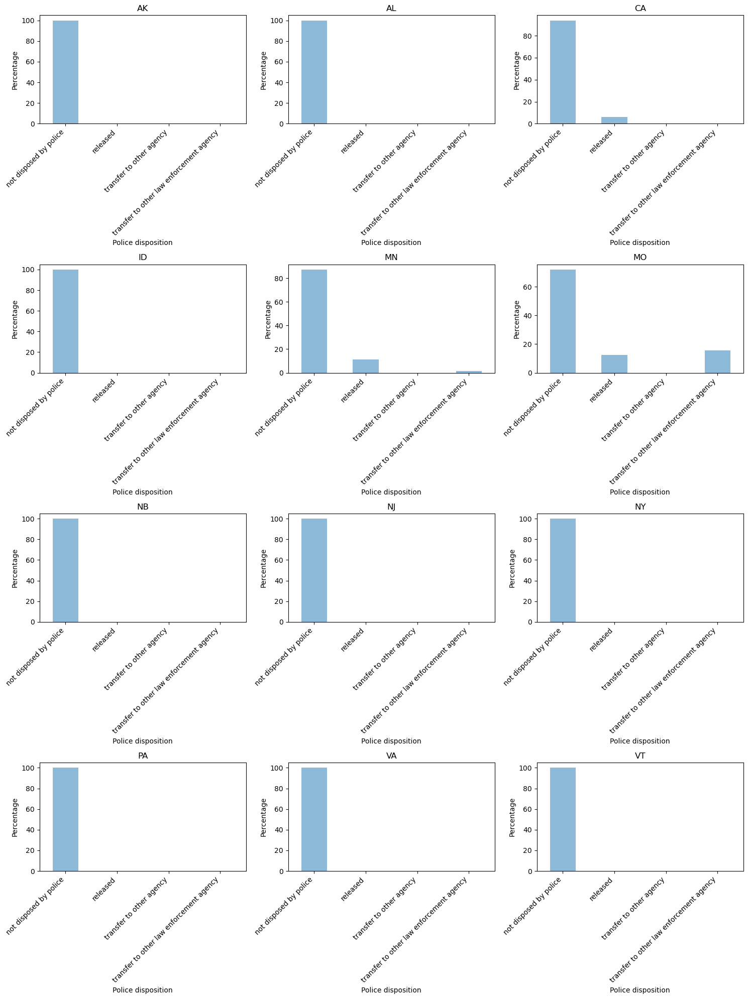

In [48]:
data_copy['police_disposition'] = pd.Categorical(data_copy['police_disposition'])

states = data_copy['state'].unique()

num_cols = 3
num_rows = len(states) // num_cols + (len(states) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

for i, state in enumerate(states):
    row = i // num_cols
    col = i % num_cols
    
    state_data = data_copy[data_copy['state'] == state]
    count_by_value = state_data.groupby('police_disposition').size()
    percent_by_value = count_by_value / count_by_value.sum() * 100
    
    ax = axes[row, col] if num_rows > 1 else axes[col]
    percent_by_value.plot(kind='bar', alpha=0.5, ax=ax)
    
    ax.set_title(f"{state}")
    ax.set_xlabel('Police disposition')
    ax.set_ylabel('Percentage')
    ax.set_xticklabels(labels=percent_by_value.index, rotation=45, ha='right')
    
    plt.tight_layout()

plt.show()

### Prosecution / grand jury disposition

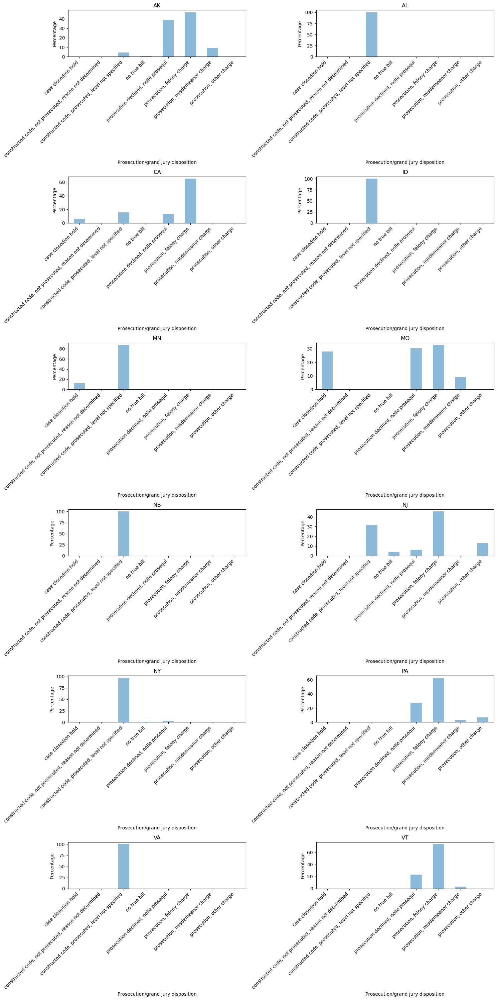

In [49]:
data_copy['prosec_grand_jury_disposition'] = pd.Categorical(data_copy['prosec_grand_jury_disposition'])

states = data_copy['state'].unique()

num_cols = 2
num_rows = len(states) // num_cols + (len(states) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

for i, state in enumerate(states):
    row = i // num_cols
    col = i % num_cols
    
    state_data = data_copy[data_copy['state'] == state]
    count_by_value = state_data.groupby('prosec_grand_jury_disposition').size()
    percent_by_value = count_by_value / count_by_value.sum() * 100
    
    ax = axes[row, col] if num_rows > 1 else axes[col]
    percent_by_value.plot(kind='bar', alpha=0.5, ax=ax)
    
    ax.set_title(f"{state}")
    ax.set_xlabel('Prosecution/grand jury disposition')
    ax.set_ylabel('Percentage')
    ax.set_xticklabels(labels=percent_by_value.index, rotation=45, ha='right')
    
    plt.tight_layout()

plt.show()

### Court disposition

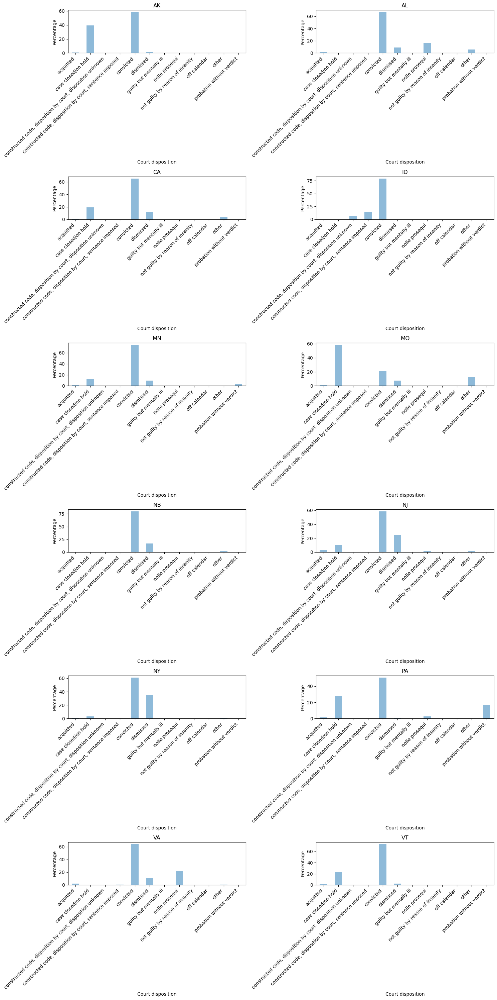

In [50]:
data_copy['court_disposition'] = pd.Categorical(data_copy['court_disposition'])

states = data_copy['state'].unique()

num_cols = 2 
num_rows = len(states) // num_cols + (len(states) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

for i, state in enumerate(states):
    row = i // num_cols
    col = i % num_cols
    
    state_data = data_copy[data_copy['state'] == state]
    count_by_value = state_data.groupby('court_disposition').size()
    percent_by_value = count_by_value / count_by_value.sum() * 100
    
    ax = axes[row, col] if num_rows > 1 else axes[col]
    percent_by_value.plot(kind='bar', alpha=0.5, ax=ax)
    
    ax.set_title(f"{state}")
    ax.set_xlabel('Court disposition')
    ax.set_ylabel('Percentage')
    ax.set_xticklabels(labels=percent_by_value.index, rotation=45, ha='right')

    
    plt.tight_layout()

plt.show()


# Pandas profiling report (EDA)

In [51]:
data = pd.read_csv('obts_recoded.csv').drop('Unnamed: 0', axis=1)

# !pip install pandas_profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(data, explorative=True)
profile.to_file("OBTS_report.html")
profile

/var/folders/p9/d79c5zx13b377v_v34ldc8zh0000gn/T/ipykernel_30504/1356988961.py:1: DtypeWarning: Columns (4,6,22,23,24,25,26,30,31,32,33,34,36,38,39,40,41,42,47,48,51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('obts_recoded.csv').drop('Unnamed: 0', axis=1)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/Users/julia_patsiukova/opt/anaconda3/lib/python3.9/site-packages/pandas_profiling/model/correlations.py:67: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/pandas-profiling/issues
(include the error message: 'No data; `observed` has size 0.')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Calculating NA % everywhere and in each state across all vars

In [52]:
na_percentages = data.groupby('state').apply(lambda x: x.isna().mean())
print(na_percentages)

       age_at_arrest       sex      race  ethnic_origin  incident_number  \
state                                                                      
AK          0.006577  0.930392  0.979446       1.000000              1.0   
AL          0.000000  0.000000  0.000000       1.000000              1.0   
CA          0.000000  0.000386  0.027904       1.000000              1.0   
ID          0.000000  0.000000  0.000000       1.000000              1.0   
MN          0.000000  0.000000  0.001861       1.000000              1.0   
MO          0.000000  0.000000  0.000000       1.000000              1.0   
NB          0.000000  0.000000  0.000125       1.000000              1.0   
NJ          0.000000  0.000000  0.038832       1.000000              1.0   
NY          0.000000  0.000022  0.015375       0.015375              1.0   
PA          0.078884  0.044199  0.097025       0.989834              1.0   
VA          0.000000  0.000000  0.002504       1.000000              1.0   
VT          

In [53]:
na_percentages.to_excel('na_percentages.xlsx')

In [54]:
na_percentages_all = data.isna().mean()
na_percentages_all

age_at_arrest                       0.011366
sex                                 0.011104
race                                0.038858
ethnic_origin                       0.751191
incident_number                     1.000000
encrypted_id_number                 0.000000
state                               0.000000
arresting_agency_county             0.000463
sub_county_code                     1.000000
year_of_arrest                      0.000000
month_of_arrest                     0.022272
day_of_arrest                       1.000000
number_of_arrest_charges            0.369904
sequence_number_of_charges          0.000000
arrest_chg_offense_code             0.004723
level_of_arrest_charge              0.000000
police_disposition                  0.000000
year_of_police_disposition          0.000000
month_of_police_disposition         0.011533
day_of_police_disposition           1.000000
elapsed_time_police_disp            0.977119
general_offense_code_police         0.400236
pre_trial_

In [55]:
na_percentages_all.to_excel('na_percentages_all.xlsx')